# Importing Required Libraries

In [192]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd 
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import seaborn as sns

import plotly.graph_objects as go
import plotly.express as px
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
plotly.offline.init_notebook_mode (connected = True)
  
from pandas.api.types import is_string_dtype

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import LabelBinarizer
from sklearn.ensemble import RandomForestClassifier

import statsmodels
import statsmodels.api as sm

# Importing The Dataset

In [101]:
a=pd.read_csv('train.csv')

In [102]:
a

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318433,318434,6,a,6,X,3,radiotherapy,Q,F,4.0,86499,23.0,Emergency,Moderate,3,41-50,4144.0,11-20
318434,318435,24,a,1,X,2,anesthesia,Q,E,4.0,325,8.0,Urgent,Moderate,4,81-90,6699.0,31-40
318435,318436,7,a,4,X,3,gynecology,R,F,4.0,125235,10.0,Emergency,Minor,3,71-80,4235.0,11-20
318436,318437,11,b,2,Y,3,anesthesia,Q,D,3.0,91081,8.0,Trauma,Minor,5,11-20,3761.0,11-20


# Understanding The Data

#### No of Rows and Columns

In [103]:
a.shape

(318438, 18)

#### Column Names and their Datatypes

In [104]:
a.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 18 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   case_id                            318438 non-null  int64  
 1   Hospital_code                      318438 non-null  int64  
 2   Hospital_type_code                 318438 non-null  object 
 3   City_Code_Hospital                 318438 non-null  int64  
 4   Hospital_region_code               318438 non-null  object 
 5   Available Extra Rooms in Hospital  318438 non-null  int64  
 6   Department                         318438 non-null  object 
 7   Ward_Type                          318438 non-null  object 
 8   Ward_Facility_Code                 318438 non-null  object 
 9   Bed Grade                          318325 non-null  float64
 10  patientid                          318438 non-null  int64  
 11  City_Code_Patient                  3139

#### Describing the Data

In [105]:
a.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
case_id,318438.0,159219.500000,91925.276847,1.0,79610.25,159219.5,238828.75,318438.0
Hospital_code,318438.0,18.318841,8.633755,1.0,11.00,19.0,26.00,32.0
City_Code_Hospital,318438.0,4.771717,3.102535,1.0,2.00,5.0,7.00,13.0
Available Extra Rooms in Hospital,318438.0,3.197627,1.168171,0.0,2.00,3.0,4.00,24.0
Bed Grade,318325.0,2.625807,0.873146,1.0,2.00,3.0,3.00,4.0
patientid,318438.0,65747.579472,37979.936440,1.0,32847.00,65724.5,98470.00,131624.0
City_Code_Patient,313906.0,7.251859,4.745266,1.0,4.00,8.0,8.00,38.0
Visitors with Patient,318438.0,3.284099,1.764061,0.0,2.00,3.0,4.00,32.0
Admission_Deposit,318438.0,4880.749392,1086.776254,1800.0,4186.00,4741.0,5409.00,11008.0


In [106]:
a.describe(include='O').transpose()

,count,unique,top,freq
Hospital_type_code,318438,7,a,143425
Hospital_region_code,318438,3,X,133336
Department,318438,5,gynecology,249486
Ward_Type,318438,6,R,127947
Ward_Facility_Code,318438,6,F,112753
Type of Admission,318438,3,Trauma,152261
Severity of Illness,318438,3,Moderate,175843
Age,318438,10,41-50,63749
Stay,318438,11,21-30,87491


## Data Visualisations

## Hospital type code
#### Let us check which code of hospitals have the highest patient density.

In [107]:
a['Count']=1

In [108]:
df_hos_code=a.groupby('Hospital_type_code')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)

In [109]:
fig1=px.bar(df_hos_code,x='Hospital_type_code',y='Count',color='Count',labels={'Hospital_type_code':'Hospital Type Code','Count':'Number of patients'})
fig1.update_layout(title='Patient distribution per hospital type code',title_x=0.5,template='plotly_dark')
fig1.show()

As we can see, the hospital type A has a much higher patient case load when in comparison any of the other hospital codes. Hospital type G has the least case load. Hence, hospital type A has a much higher likelihood of running out of patient beds while G has the least. The ideal distribution would've been a uniform distribution where the under utilised beds of other hospital type codes may have been equally utilised.

## Hospital region code

The region code would likely divide all the available hospitals into three regions encoded as X,Y and Z. This will again let us know which hospital type belongs to which region and their corresponding case loads as well.

In [110]:
fig2=px.sunburst(a,path=['Hospital_region_code','Hospital_type_code'])
fig2.update_layout(title='Hospital region case load distribution',title_x=0.5)
fig2.show()

As we can see from the above sunburst plot, the case loads in hospital region X is marginally higher than hospital region Y and the least in region Z . For region X, the hospital type A had highest case load while it was more equally balanced between a and b in region Y. For region Z, highest case loads were in hospital type C. Hospitals in region X seem to show better distribution amogst all the hospital types.

For region Y, distribution between A and B is ideal but f,d and g have been under utilised. For Z, cases in hospital c were easily the highest but a and d are extremely under utilised.

## Available Extra Rooms in Hospital

In [111]:
fig3=px.histogram(a,x='Available Extra Rooms in Hospital',marginal='box',color_discrete_sequence=['orange'],opacity=0.7)
fig3.update_layout(template='plotly_dark',title='Number of hospitals with extra rooms',title_x=0.5)
fig3.show()

As we can see from the above histogram, majority of hospitals have extra rooms in the size of 2,3 or 4 rooms. The median extra rooms is 3.

## Department

In [112]:
df_dept=a.groupby('Department')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)

In [113]:
fig5=px.bar(df_dept,x='Department',y='Count',color='Department',labels={'Count':'Number of patients'})
fig5.update_layout(title='Case load distribution per department',title_x=0.5,template='plotly_dark')
fig5.show()

From the above bar plot, we see that majority of the patients register themselves at the gynecology department. Surgery department has the least number of case loads. This is expected as daily birth cases are far higher than daily surgeries.

## Severity Of Illness

In [114]:
df_sev=a.groupby('Severity of Illness')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)
fig6=px.funnel(df_sev,x='Count',y='Severity of Illness',labels={'Count':'Number of patients'},color='Count')
fig6.update_layout(title='Case load depending upon severity of illness',title_x=0.5,template='plotly_dark')
fig6.show()

From the above funnel plot, we see that most numner of cases are moderate in nature followed by minor and then, extreme

## Age vs Severity of Illness

In [115]:
fig7=px.sunburst(a,path=['Age','Severity of Illness'])
fig7.update_layout(title='Age (in years) and Severity of Illness',title_x=0.5)
fig7.show()

As we can see from the sunburst plot above, extreme cases are least for each age group. However, the extreme cases in relation to the moderate and minor cases seem to increase with higher age groups.

## Severity of illness Vs Stay

In [116]:
fig8=px.sunburst(a,path=['Stay','Severity of Illness'])
fig8.update_layout(title='Stay period (in days) vs Severity of illness',title_x=0.5)
fig8.show()

From the above plot, it is seen that generally for lower stay duration(upto 20 days), the severity of illness is majorly minor or moderate. For higher stay duration, the extreme severity cases start rising.

21-30 days and 11-20 days are the most common stay periods across the hospitals.

## Data Wrangling

#### Unique values in each column

In [117]:
a.nunique()

case_id                              318438
Hospital_code                            32
Hospital_type_code                        7
City_Code_Hospital                       11
Hospital_region_code                      3
Available Extra Rooms in Hospital        18
Department                                5
Ward_Type                                 6
Ward_Facility_Code                        6
Bed Grade                                 4
patientid                             92017
City_Code_Patient                        37
Type of Admission                         3
Severity of Illness                       3
Visitors with Patient                    28
Age                                      10
Admission_Deposit                      7300
Stay                                     11
Count                                     1
dtype: int64

In [118]:
# dropping case_id as it has all records unique

a.drop(['case_id'],axis=1,inplace=True)

#### checking the null values

In [119]:
a.isnull().sum().sort_values(ascending=False)

City_Code_Patient                    4532
Bed Grade                             113
Ward_Facility_Code                      0
Hospital_type_code                      0
City_Code_Hospital                      0
Hospital_region_code                    0
Available Extra Rooms in Hospital       0
Department                              0
Ward_Type                               0
Count                                   0
Stay                                    0
patientid                               0
Type of Admission                       0
Severity of Illness                     0
Visitors with Patient                   0
Age                                     0
Admission_Deposit                       0
Hospital_code                           0
dtype: int64

from this we can say that there are null values in Bed Grade and City_Code_Patient
we have total of 318438 records, whereas the missing values are very less
hence we can drop those records with missing values

#### Dropping na

In [121]:
a=a.dropna()

In [122]:
a.shape

(313793, 18)

#### Comparing No of Unique values and DataTypes in the columns

In [123]:
u=pd.DataFrame(a.nunique(),columns=['No of Unique Values'])
d=pd.DataFrame(a.dtypes,columns=['DataTypes'])
b=pd.concat([u,d],axis=1)
b

,No of Unique Values,DataTypes
Hospital_code,32,int64
Hospital_type_code,7,object
City_Code_Hospital,11,int64
Hospital_region_code,3,object
Available Extra Rooms in Hospital,18,int64
Department,5,object
Ward_Type,6,object
Ward_Facility_Code,6,object
Bed Grade,4,float64
patientid,90344,int64


from the above table we can say that the columns
['Hospital_code','City_Code_Hospital','Available Extra Rooms in Hospital','Bed Grade','City_Code_Patient','Visitors with Patient']
these columns are categorical in nature, but their datatype is in int or float

## Correlation

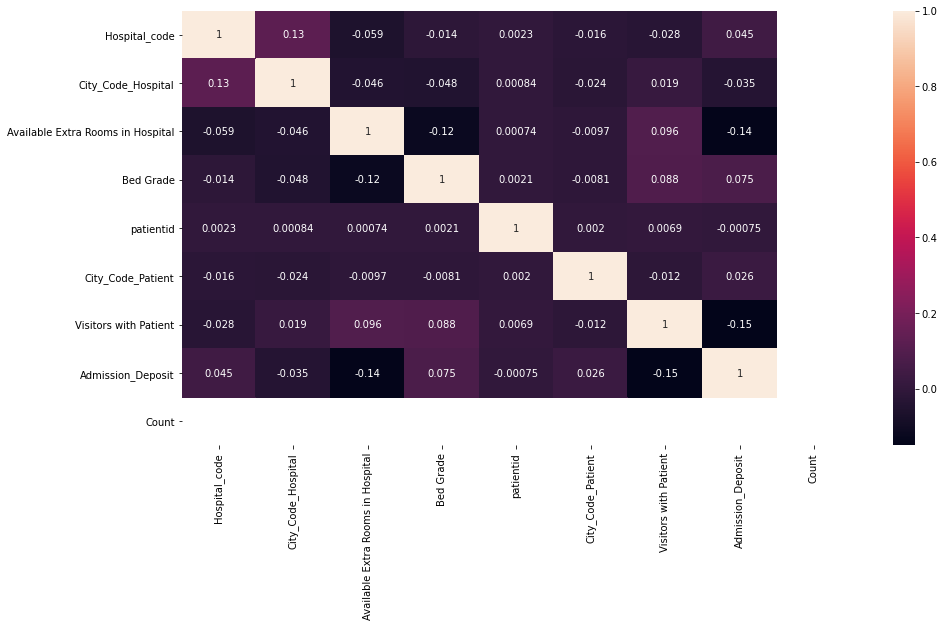

In [124]:
plt.figure(figsize=(15,8))
sns.heatmap(a.corr(),annot=True)
plt.show()

from the correlation map we can say that the no two features are correlated 
correlation does not cause causation

#### Converting the datatypes of discrete columns

In [125]:
discrete_columns=['Hospital_code','City_Code_Hospital','Available Extra Rooms in Hospital','Bed Grade',
                   'City_Code_Patient','Visitors with Patient']
for i in discrete_columns:
    a[i]=a[i].astype(object)

In [126]:
a.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 313793 entries, 0 to 318437
Data columns (total 18 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Hospital_code                      313793 non-null  object 
 1   Hospital_type_code                 313793 non-null  object 
 2   City_Code_Hospital                 313793 non-null  object 
 3   Hospital_region_code               313793 non-null  object 
 4   Available Extra Rooms in Hospital  313793 non-null  object 
 5   Department                         313793 non-null  object 
 6   Ward_Type                          313793 non-null  object 
 7   Ward_Facility_Code                 313793 non-null  object 
 8   Bed Grade                          313793 non-null  object 
 9   patientid                          313793 non-null  int64  
 10  City_Code_Patient                  313793 non-null  object 
 11  Type of Admission                  3137

#### Thus now we have only two numerical columns, patientid and Admission_Deposit

## Analysis of Numerical Features

In [127]:
numerical_features=[features for features in a.columns if  a[features].dtypes != 'O']

In [128]:
numerical_features

['patientid', 'Admission_Deposit', 'Count']

#### Viewing the distribution of numerical features

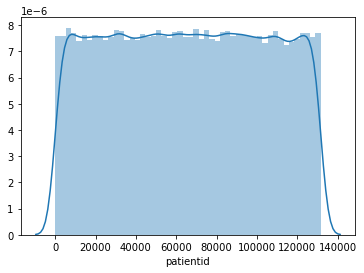

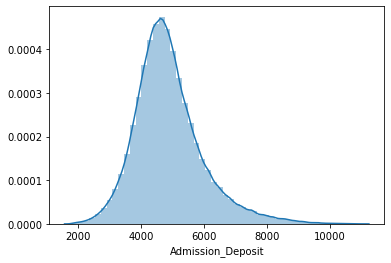

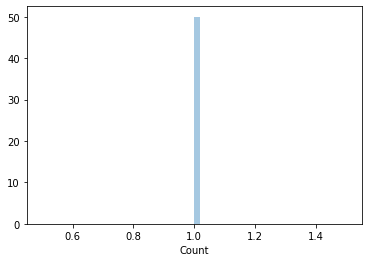

In [129]:
for feature in numerical_features:
    sns.distplot(a[feature])
    plt.show()

#### Replacing the values in the patientid column with its count and changing the column name as 'no_patient_visit' 

In [130]:
# By replacing the patient id with its count we can get some meaniningful information like
# how many times the patient has visited the hospital

vc_patientid = a['patientid'].value_counts()

a['patientid']=a['patientid'].apply(lambda x: vc_patientid[x])

a.rename(columns={'patientid': 'no_patient_visit'}, inplace=True)

In [131]:
a['no_patient_visit']

0         14
1         14
2         14
3         14
4         14
          ..
318433     1
318434     1
318435     1
318436     1
318437     1
Name: no_patient_visit, Length: 313793, dtype: int64

#### Now chcking the distribution plot for 'no_patient_visit'

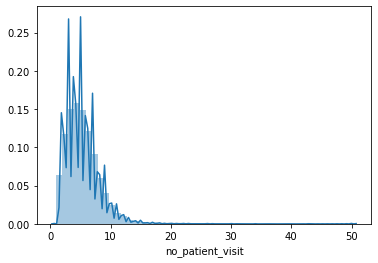

In [132]:
sns.distplot(a['no_patient_visit'])

#### Box plot of numerical features

In [133]:
numerical_features=[features for features in a.columns if  a[features].dtypes != 'O']

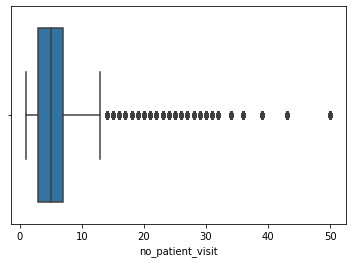

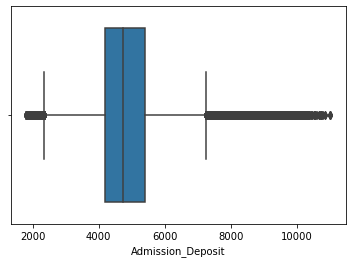

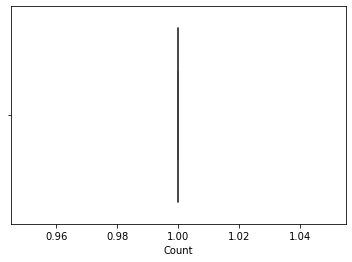

In [134]:
for feature in numerical_features:
    sns.boxplot(a[feature])
    plt.show()

In [135]:
# from box plots we can say that outliers are there in bothe the features

## Outlier treatment

In [136]:
def outlier_treatment(column_name):
    print('The Skewness Before Treatment is :',a[column_name].skew())
    i=a[column_name]
    qU=a[column_name].quantile(0.90)
    qL=a[column_name].quantile(0.10)
    a[column_name]=np.where(a[column_name]>qU,qU,a[column_name])
    a[column_name]=np.where(a[column_name]<qL,qL,a[column_name])
    print('The Quantile(0.90) is :',qU)
    print('The Quantile(0.10) is :',qL)
    print('The Skewness After Treatment is :',a[column_name].skew())
    print('The Box Plot After Treatment is:')
    sns.boxplot(a[column_name])

The Skewness Before Treatment is : 2.5586445641523152
The Quantile(0.90) is : 9.0
The Quantile(0.10) is : 2.0
The Skewness After Treatment is : 0.38514710802479984
The Box Plot After Treatment is:


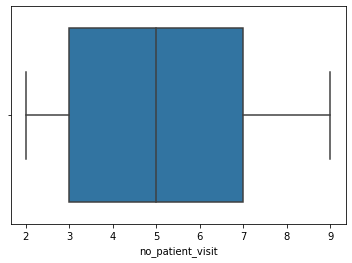

In [137]:
outlier_treatment('no_patient_visit')

The Skewness Before Treatment is : 0.9307755404140482
The Quantile(0.90) is : 6256.0
The Quantile(0.10) is : 3688.0
The Skewness After Treatment is : 0.320785813303646
The Box Plot After Treatment is:


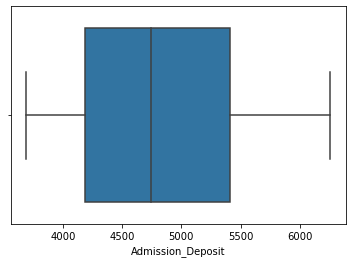

In [138]:
outlier_treatment('Admission_Deposit')

## Feature Scaling 

In [139]:
a_num = (a[numerical_features] - a[numerical_features].mean()) / a[numerical_features].std()

In [140]:
a_num

,no_patient_visit,Admission_Deposit,Count
0,1.820306,0.096415,NaN
1,1.820306,1.391531,NaN
2,1.820306,-0.109711,NaN
3,1.820306,1.766531,NaN
4,1.820306,0.899809,NaN
...,...,...,...
318433,-1.297159,-0.855986,NaN
318434,-1.297159,1.766531,NaN
318435,-1.297159,-0.742989,NaN
318436,-1.297159,-1.331565,NaN


## Analysing Categorical Features

In [141]:
categorical_features=[features for features in a.columns if a[features].dtypes=='O' and features != 'Stay']

In [142]:
categorical_features

['Hospital_code',
 'Hospital_type_code',
 'City_Code_Hospital',
 'Hospital_region_code',
 'Available Extra Rooms in Hospital',
 'Department',
 'Ward_Type',
 'Ward_Facility_Code',
 'Bed Grade',
 'City_Code_Patient',
 'Type of Admission',
 'Severity of Illness',
 'Visitors with Patient',
 'Age']

In [143]:
a[categorical_features].nunique()

Hospital_code                        32
Hospital_type_code                    7
City_Code_Hospital                   11
Hospital_region_code                  3
Available Extra Rooms in Hospital    18
Department                            5
Ward_Type                             6
Ward_Facility_Code                    6
Bed Grade                             4
City_Code_Patient                    37
Type of Admission                     3
Severity of Illness                   3
Visitors with Patient                28
Age                                  10
dtype: int64

#### Distribution of Categorical Features

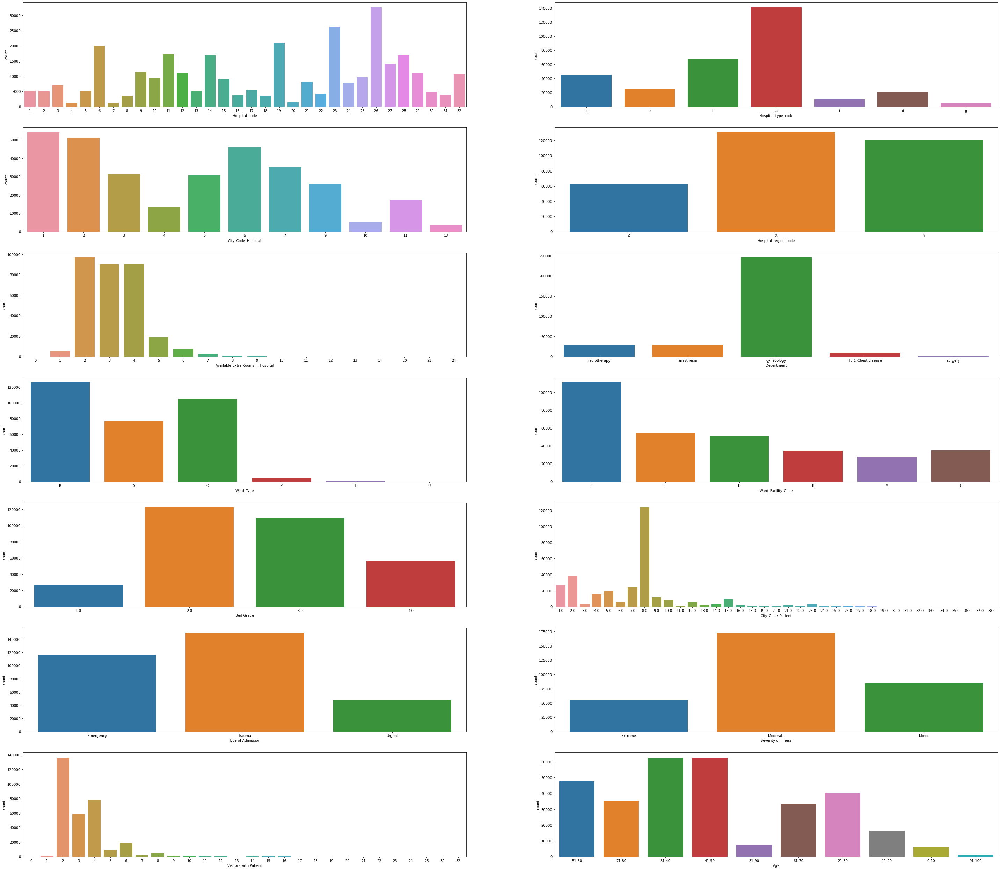

In [144]:
fig, ax = plt.subplots(7, 2, figsize = (50, 45))

for variable, subplot in zip(categorical_features, ax.flatten()):
    sns.countplot(a[variable], ax = subplot)
    
plt.show()

The columns ['Hospital_code','City_Code_Patient','Visitors with Patient']
have more categories, which will lead to high cardinality problems

#### grouping minority categories in city_code_patient

In [145]:
city_code_patients = a['City_Code_Patient'].value_counts(normalize=True)
print(city_code_patients)

8.0     0.395092
2.0     0.123760
1.0     0.083995
7.0     0.075837
5.0     0.063988
4.0     0.049010
9.0     0.037585
15.0    0.028500
10.0    0.026043
6.0     0.019137
12.0    0.017993
3.0     0.012021
23.0    0.011782
14.0    0.009328
16.0    0.007177
13.0    0.005179
21.0    0.005105
20.0    0.004490
18.0    0.004474
19.0    0.003276
26.0    0.003260
25.0    0.002543
27.0    0.002457
11.0    0.002097
28.0    0.001660
22.0    0.001291
24.0    0.001147
30.0    0.000424
29.0    0.000312
33.0    0.000249
31.0    0.000188
37.0    0.000182
32.0    0.000166
34.0    0.000147
35.0    0.000051
36.0    0.000038
38.0    0.000019
Name: City_Code_Patient, dtype: float64


In [146]:
minorities_ccp =city_code_patients.where(city_code_patients<0.02).dropna().index.values
a['City_Code_Patient']=np.where(a['City_Code_Patient'].isin(minorities_ccp), '0',  a['City_Code_Patient'])

#### grouping minority categories in hospital_code

In [147]:
hospital_code = a['Hospital_code'].value_counts(normalize=True)
print(hospital_code)

26    0.104148
23    0.083214
19    0.067035
6     0.063787
11    0.054517
28    0.054007
14    0.053911
27    0.044963
9     0.036269
12    0.035530
29    0.035348
32    0.033656
25    0.030727
10    0.029545
15    0.029108
21    0.025644
24    0.024969
3     0.022403
17    0.017123
1     0.016533
13    0.016501
5     0.016390
2     0.016093
30    0.015670
22    0.013503
31    0.012531
16    0.011571
8     0.011508
18    0.011447
20    0.004430
7     0.004044
4     0.003875
Name: Hospital_code, dtype: float64


In [149]:
minorities_hospitals =hospital_code.where(hospital_code<0.04).dropna().index.values
a['Hospital_code']=np.where(a['Hospital_code'].isin(minorities_hospitals), '0',  a['Hospital_code'])

#### grouping minority categories in Visitors with Patient

In [150]:
VisitorsWithPatient = a['Visitors with Patient'].value_counts(normalize=True)
print(VisitorsWithPatient)

2     0.435574
4     0.248712
3     0.185661
6     0.058988
5     0.028771
8     0.015217
7     0.007817
9     0.004242
1     0.003789
10    0.003722
12    0.003024
11    0.001013
16    0.000895
14    0.000644
15    0.000596
13    0.000325
24    0.000249
18    0.000191
20    0.000188
17    0.000064
22    0.000061
0     0.000057
19    0.000038
25    0.000038
21    0.000035
23    0.000032
30    0.000029
32    0.000029
Name: Visitors with Patient, dtype: float64


In [151]:
minorities_VisitorsWithPatient =VisitorsWithPatient.where(VisitorsWithPatient<0.003722).dropna().index.values
a['Visitors with Patient']=np.where(a['Visitors with Patient'].isin(minorities_VisitorsWithPatient), '10+',  a['Visitors with Patient'])

In [152]:
a['Visitors with Patient'].value_counts()

2      136680
4       78044
3       58259
6       18510
5        9028
8        4775
7        2453
10+      2356
9        1331
1        1189
10       1168
Name: Visitors with Patient, dtype: int64

#### grouping minority categories in Available Extra Rooms in Hospital

In [153]:
extra_rooms=a['Available Extra Rooms in Hospital'].value_counts(normalize=True)
print(extra_rooms)

2     0.309175
4     0.287702
3     0.287569
5     0.060349
6     0.024376
1     0.017483
7     0.009041
8     0.003241
9     0.000692
10    0.000201
11    0.000054
0     0.000048
12    0.000041
21    0.000010
13    0.000006
20    0.000006
14    0.000003
24    0.000003
Name: Available Extra Rooms in Hospital, dtype: float64


In [154]:
minorities_extra_rooms =extra_rooms.where(extra_rooms<0.01).dropna().index.values
a['Available Extra Rooms in Hospital']=np.where(a['Available Extra Rooms in Hospital'].isin(minorities_extra_rooms), '6+',  a['Available Extra Rooms in Hospital'])

In [155]:
# now checking the unique values

a[categorical_features].nunique()

Hospital_code                         9
Hospital_type_code                    7
City_Code_Hospital                   11
Hospital_region_code                  3
Available Extra Rooms in Hospital     7
Department                            5
Ward_Type                             6
Ward_Facility_Code                    6
Bed Grade                             4
City_Code_Patient                    10
Type of Admission                     3
Severity of Illness                   3
Visitors with Patient                11
Age                                  10
dtype: int64

## Dummification for categorical features

In [156]:
a_cat=pd.get_dummies(a[categorical_features],drop_first=True)

In [157]:
a_cat

,Hospital_code_11,Hospital_code_14,Hospital_code_19,Hospital_code_23,Hospital_code_26,Hospital_code_27,Hospital_code_28,Hospital_code_0,Hospital_type_code_b,Hospital_type_code_c,...,Visitors with Patient_10+,Age_11-20,Age_21-30,Age_31-40,Age_41-50,Age_51-60,Age_61-70,Age_71-80,Age_81-90,Age_91-100
0,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,1,0,0,0,0
1,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,1,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318433,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
318434,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
318435,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
318436,1,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0


#### conacting a_num and a_cat

In [158]:
a_num.shape

(313793, 3)

In [159]:
a_cat.shape

(313793, 81)

In [160]:
a_final=pd.concat([a_num,a_cat],axis=1)

In [161]:
a_final.shape

(313793, 84)

In [162]:
a_final

,no_patient_visit,Admission_Deposit,Count,Hospital_code_11,Hospital_code_14,Hospital_code_19,Hospital_code_23,Hospital_code_26,Hospital_code_27,Hospital_code_28,...,Visitors with Patient_10+,Age_11-20,Age_21-30,Age_31-40,Age_41-50,Age_51-60,Age_61-70,Age_71-80,Age_81-90,Age_91-100
0,1.820306,0.096415,NaN,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,1.820306,1.391531,NaN,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,1.820306,-0.109711,NaN,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,1.820306,1.766531,NaN,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
4,1.820306,0.899809,NaN,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318433,-1.297159,-0.855986,NaN,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
318434,-1.297159,1.766531,NaN,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
318435,-1.297159,-0.742989,NaN,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
318436,-1.297159,-1.331565,NaN,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [173]:
a_final.drop(['Count'],axis=1,inplace=True)

## Analysing Target Feature

In [163]:
a['Stay'].value_counts()

21-30                 86316
11-20                 77095
31-40                 54312
51-60                 34463
0-10                  23250
41-50                 11541
71-80                 10096
More than 100 Days     6548
81-90                  4761
91-100                 2713
61-70                  2698
Name: Stay, dtype: int64

the data is imbalanced

#### Label encoding Target Feature

In [165]:
le = LabelEncoder()
target_enc= le.fit_transform(a['Stay'])

In [166]:
a_target_enc=pd.DataFrame(target_enc)

In [167]:
a_target_enc

,0
0,0
1,4
2,3
3,4
4,4
...,...
313788,1
313789,3
313790,1
313791,1


## Preparing the X, Y data

In [174]:
x=a_final
y=a_target_enc

## Splitting the Data

In [175]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state = 10)

# print dimension of train set
print("x_train",x_train.shape)
print("y_train",y_train.shape)

# print dimension of test set
print("x_test",x_test.shape)
print("y_test",y_test.shape)

x_train (219655, 83)
y_train (219655, 1)
x_test (94138, 83)
y_test (94138, 1)


## Creating Functions

#### function for multiclass roc_auc score

In [176]:
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

#### function for score card

In [177]:
# create an empty dataframe to store the scores for various classification algorithms
score_card = pd.DataFrame(columns=['Model', 'AUC Score', 'Precision Score', 'Recall Score', 'Accuracy Score',
                                   'Kappa Score', 'f1-score'])
 
def update_score_card(model_name):
    
    global score_card
    score_card = score_card.append({'Model': model_name,
                                    'AUC Score' : multiclass_roc_auc_score(y_test, y_pred),
                                    'Precision Score': metrics.precision_score(y_test, y_pred,average='micro'),
                                    'Recall Score': metrics.recall_score(y_test, y_pred,average='micro'),
                                    'Accuracy Score': metrics.accuracy_score(y_test, y_pred),
                                    'Kappa Score': cohen_kappa_score(y_test, y_pred),
                                    'f1-score': metrics.f1_score(y_test, y_pred,average='micro')}, 
                                    ignore_index = True)
    return(score_card)

## OneVsRest Model

In [178]:
clf = OneVsRestClassifier(LogisticRegression()).fit(x_train, y_train)

In [179]:
y_pred = clf.predict(x_test)
y_pred

array([1, 2, 2, ..., 3, 2, 1])

In [180]:
y_pred_prob = clf.predict_proba(x_test)
y_pred_prob

array([[0.02794628, 0.38869507, 0.26701134, ..., 0.00275624, 0.00189489,
        0.00114071],
       [0.08060003, 0.28819699, 0.43333663, ..., 0.00104987, 0.00101488,
        0.00068455],
       [0.01935008, 0.16160196, 0.4963985 , ..., 0.00468616, 0.00258888,
        0.00725985],
       ...,
       [0.04555461, 0.25632121, 0.19860993, ..., 0.00396341, 0.00613903,
        0.00266222],
       [0.04120769, 0.19294696, 0.36121232, ..., 0.00791018, 0.00577011,
        0.01007864],
       [0.28112095, 0.40993669, 0.13751673, ..., 0.0038207 , 0.00065568,
        0.00338416]])

In [181]:
confusion_matrix(y_test,y_pred)

array([[  307,  3582,  2876,   128,     0,     8,     0,     0,     0,
            0,     0],
       [  133, 11557,  9702,   885,     0,   925,     0,     0,     0,
            0,     3],
       [   89,  7558, 17076,   633,     0,   400,     0,     0,     4,
            0,    32],
       [   72,  3756,  6749,  2412,     0,  3250,     0,     0,     3,
            0,    47],
       [   21,   739,  2182,   226,     1,   238,     0,     0,     2,
            0,    30],
       [   33,  1162,  1963,  2000,     1,  5153,     0,     3,    18,
            0,   137],
       [    4,   125,   441,    90,     0,   141,     0,     0,     1,
            0,    20],
       [   11,   290,   431,   705,     0,  1452,     0,     0,     7,
            0,   197],
       [    0,    59,    74,    94,     0,  1056,     0,     0,    18,
            0,   111],
       [    2,    65,   110,   141,     0,   353,     0,     1,     5,
            0,   105],
       [    3,   108,   104,   164,     0,   837,     0,    

In [182]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.45      0.04      0.08      6901
           1       0.40      0.50      0.44     23205
           2       0.41      0.66      0.51     25792
           3       0.32      0.15      0.20     16289
           4       0.50      0.00      0.00      3439
           5       0.37      0.49      0.42     10470
           6       0.00      0.00      0.00       822
           7       0.00      0.00      0.00      3093
           8       0.20      0.01      0.02      1412
           9       0.00      0.00      0.00       782
          10       0.50      0.35      0.41      1933

    accuracy                           0.40     94138
   macro avg       0.29      0.20      0.19     94138
weighted avg       0.37      0.40      0.34     94138



#### Plot multi-class roc curve

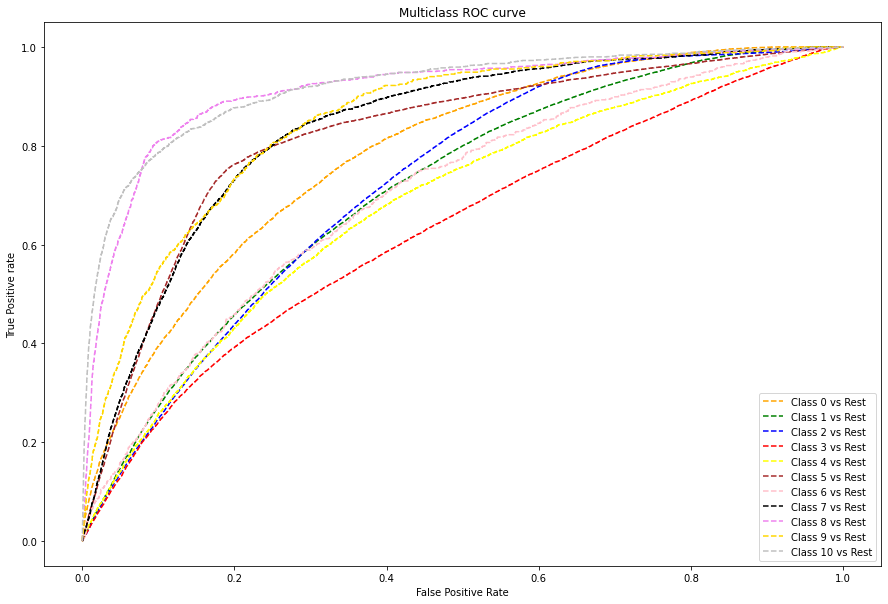

In [183]:
fpr = {}
tpr = {}
thresh ={}

n_class = 11

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, y_pred_prob[:,i], pos_label=i)
    
# plotting
plt.figure(figsize=(15,10))
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label='Class 3 vs Rest')
plt.plot(fpr[4], tpr[4], linestyle='--',color='yellow', label='Class 4 vs Rest')
plt.plot(fpr[5], tpr[5], linestyle='--',color='brown', label='Class 5 vs Rest')
plt.plot(fpr[6], tpr[6], linestyle='--',color='pink', label='Class 6 vs Rest')
plt.plot(fpr[7], tpr[7], linestyle='--',color='black', label='Class 7 vs Rest')
plt.plot(fpr[8], tpr[8], linestyle='--',color='violet', label='Class 8 vs Rest')
plt.plot(fpr[9], tpr[9], linestyle='--',color='gold', label='Class 9 vs Rest')
plt.plot(fpr[10], tpr[10], linestyle='--',color='silver', label='Class 10 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300);  
plt.show()

In [184]:
update_score_card(model_name='OneVsrest(LogReg)')

,Model,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,OneVsrest(LogReg),0.564744,0.39525,0.39525,0.39525,0.216409,0.39525


## OneVsRest LogReg with SGD

In [185]:
clf = OneVsRestClassifier(SGDClassifier(loss='log')).fit(x_train, y_train)

In [186]:
y_pred = clf.predict(x_test)
y_pred

array([2, 2, 2, ..., 3, 2, 1])

In [187]:
y_pred_prob = clf.predict_proba(x_test)
y_pred_prob

array([[0.02950715, 0.30799086, 0.33866776, ..., 0.00319101, 0.00213465,
        0.00168451],
       [0.10190454, 0.27542674, 0.44555745, ..., 0.00109648, 0.00134338,
        0.00122766],
       [0.02551407, 0.13884909, 0.52866268, ..., 0.00487474, 0.00293245,
        0.00877743],
       ...,
       [0.04067855, 0.23772836, 0.22051482, ..., 0.00493746, 0.00646173,
        0.00412995],
       [0.04792607, 0.17244265, 0.39719961, ..., 0.00866487, 0.0077718 ,
        0.01175026],
       [0.29511322, 0.38351423, 0.13589741, ..., 0.00488943, 0.00106716,
        0.00422949]])

In [188]:
confusion_matrix(y_test,y_pred)

array([[  438,  2951,  3275,   184,     0,    51,     0,     0,     0,
            0,     2],
       [  239,  9182, 11663,  1177,     0,   938,     0,     0,     0,
            0,     6],
       [  172,  5684, 18588,   870,     0,   447,     0,     1,     1,
            0,    29],
       [  112,  2867,  7320,  2683,     1,  3268,     0,     0,     1,
            0,    37],
       [   33,   583,  2284,   256,     1,   251,     0,     2,     1,
            0,    28],
       [   61,   906,  2156,  2109,     0,  5115,     0,     5,     9,
            0,   109],
       [    5,    76,   471,   102,     0,   151,     0,     0,     0,
            0,    17],
       [   16,   221,   466,   720,     0,  1485,     0,     2,     4,
            0,   179],
       [    1,    56,    82,   107,     1,  1065,     0,     0,     9,
            0,    91],
       [    1,    47,   117,   161,     0,   353,     0,     0,     3,
            0,   100],
       [    8,    77,   134,   159,     0,   891,     0,    

In [189]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.40      0.06      0.11      6901
           1       0.41      0.40      0.40     23205
           2       0.40      0.72      0.51     25792
           3       0.31      0.16      0.22     16289
           4       0.33      0.00      0.00      3439
           5       0.36      0.49      0.42     10470
           6       0.00      0.00      0.00       822
           7       0.11      0.00      0.00      3093
           8       0.21      0.01      0.01      1412
           9       0.00      0.00      0.00       782
          10       0.52      0.33      0.40      1933

    accuracy                           0.39     94138
   macro avg       0.28      0.20      0.19     94138
weighted avg       0.36      0.39      0.34     94138



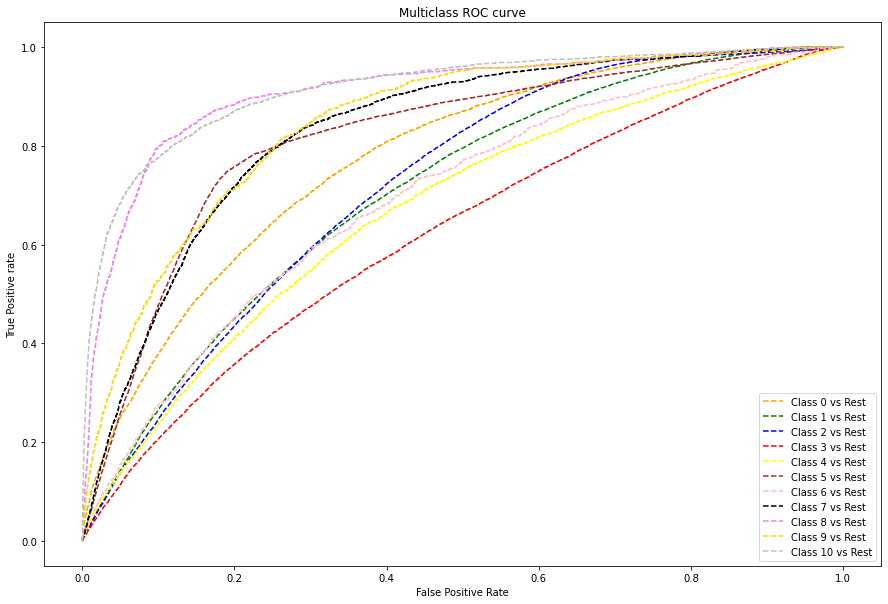

In [190]:
fpr = {}
tpr = {}
thresh ={}

n_class = 11

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, y_pred_prob[:,i], pos_label=i)
    
# plotting
plt.figure(figsize=(15,10))
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label='Class 3 vs Rest')
plt.plot(fpr[4], tpr[4], linestyle='--',color='yellow', label='Class 4 vs Rest')
plt.plot(fpr[5], tpr[5], linestyle='--',color='brown', label='Class 5 vs Rest')
plt.plot(fpr[6], tpr[6], linestyle='--',color='pink', label='Class 6 vs Rest')
plt.plot(fpr[7], tpr[7], linestyle='--',color='black', label='Class 7 vs Rest')
plt.plot(fpr[8], tpr[8], linestyle='--',color='violet', label='Class 8 vs Rest')
plt.plot(fpr[9], tpr[9], linestyle='--',color='gold', label='Class 9 vs Rest')
plt.plot(fpr[10], tpr[10], linestyle='--',color='silver', label='Class 10 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300);  
plt.show()

In [191]:
update_score_card(model_name='OneVsrest(LogRegSGD)')

,Model,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,OneVsrest(LogReg),0.564744,0.395250,0.395250,0.395250,0.216409,0.395250
1,OneVsrest(LogRegSGD),0.562615,0.389428,0.389428,0.389428,0.208930,0.389428


## Random Forest Classifier

In [193]:
rclf = OneVsRestClassifier(RandomForestClassifier(max_depth=10,random_state=0)).fit(x_train, y_train)

In [194]:
y_pred = rclf.predict(x_test)
y_pred

array([2, 2, 2, ..., 2, 2, 1])

In [195]:
y_pred_prob = rclf.predict_proba(x_test)
y_pred_prob

array([[0.05137047, 0.30681921, 0.32559261, ..., 0.00645375, 0.00524204,
        0.00790722],
       [0.08670255, 0.24859693, 0.4195565 , ..., 0.00250039, 0.00187121,
        0.00416198],
       [0.03670315, 0.19737922, 0.42687281, ..., 0.0066537 , 0.00560699,
        0.00909224],
       ...,
       [0.06145234, 0.26392246, 0.29803095, ..., 0.00666578, 0.00534828,
        0.00822837],
       [0.06118748, 0.22338989, 0.31887172, ..., 0.01411008, 0.00963544,
        0.00982267],
       [0.1538837 , 0.35043387, 0.26636589, ..., 0.00455264, 0.00309558,
        0.00710705]])

In [196]:
confusion_matrix(y_test,y_pred)

array([[   38,  3263,  3522,    26,     0,    52,     0,     0,     0,
            0,     0],
       [   10, 10419, 10940,   946,     0,   888,     0,     0,     0,
            0,     2],
       [   10,  6810, 18136,   298,     0,   508,     0,     1,     7,
            0,    22],
       [    2,  2812,  7147,  3500,     0,  2779,     0,     7,     1,
            0,    41],
       [    2,   637,  2319,   176,     0,   276,     0,     0,     3,
            0,    26],
       [    3,   783,  1835,  2435,     0,  5294,     0,     1,    24,
            1,    94],
       [    0,    98,   465,    65,     0,   164,     0,     1,     2,
            0,    27],
       [    1,   210,   412,   687,     0,  1536,     0,    30,     7,
            0,   210],
       [    1,    60,   100,   115,     0,   988,     0,     5,    54,
            0,    89],
       [    0,    41,   103,   151,     0,   373,     0,     4,     1,
           12,    97],
       [    1,    98,   145,   133,     0,   761,     0,    

In [197]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.56      0.01      0.01      6901
           1       0.41      0.45      0.43     23205
           2       0.40      0.70      0.51     25792
           3       0.41      0.21      0.28     16289
           4       0.00      0.00      0.00      3439
           5       0.39      0.51      0.44     10470
           6       0.00      0.00      0.00       822
           7       0.41      0.01      0.02      3093
           8       0.44      0.04      0.07      1412
           9       0.75      0.02      0.03       782
          10       0.55      0.38      0.45      1933

    accuracy                           0.41     94138
   macro avg       0.39      0.21      0.20     94138
weighted avg       0.40      0.41      0.36     94138



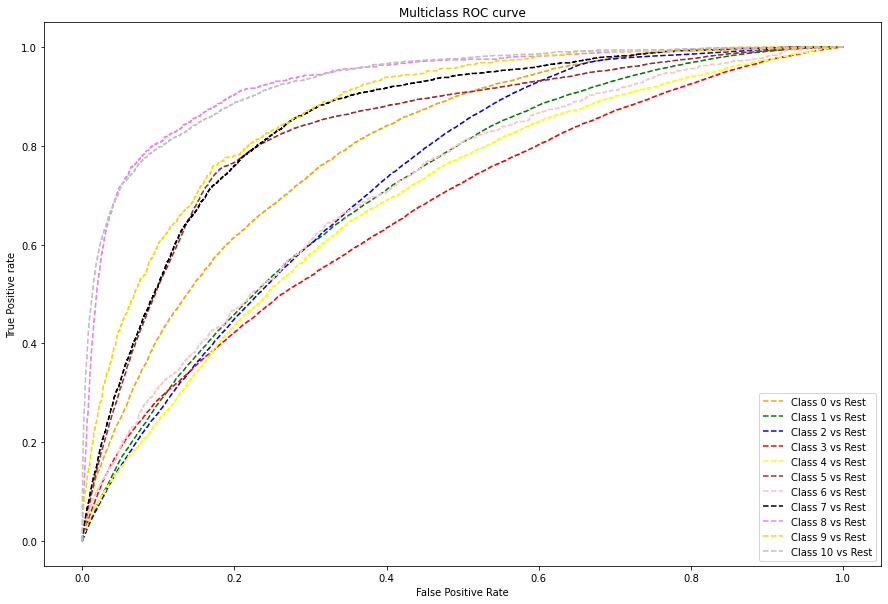

In [198]:
fpr = {}
tpr = {}
thresh ={}

n_class = 11

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, y_pred_prob[:,i], pos_label=i)
    
# plotting
plt.figure(figsize=(15,10))
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label='Class 3 vs Rest')
plt.plot(fpr[4], tpr[4], linestyle='--',color='yellow', label='Class 4 vs Rest')
plt.plot(fpr[5], tpr[5], linestyle='--',color='brown', label='Class 5 vs Rest')
plt.plot(fpr[6], tpr[6], linestyle='--',color='pink', label='Class 6 vs Rest')
plt.plot(fpr[7], tpr[7], linestyle='--',color='black', label='Class 7 vs Rest')
plt.plot(fpr[8], tpr[8], linestyle='--',color='violet', label='Class 8 vs Rest')
plt.plot(fpr[9], tpr[9], linestyle='--',color='gold', label='Class 9 vs Rest')
plt.plot(fpr[10], tpr[10], linestyle='--',color='silver', label='Class 10 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300);  
plt.show()

In [199]:
update_score_card(model_name='OneVsrest(RandomForestClassifier)')

,Model,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,OneVsrest(LogReg),0.564744,0.395250,0.395250,0.395250,0.216409,0.395250
1,OneVsrest(LogRegSGD),0.562615,0.389428,0.389428,0.389428,0.208930,0.389428
2,OneVsrest(RandomForestClassifier),0.570445,0.406063,0.406063,0.406063,0.229090,0.406063


With random forest classifier the accuracy and f1 score has increased

## Oversampling

In [200]:
x=a_final
y=a_target_enc

In [201]:
y[0].value_counts()

2     86316
1     77095
3     54312
5     34463
0     23250
4     11541
7     10096
10     6548
8      4761
9      2713
6      2698
Name: 0, dtype: int64

In [202]:
from imblearn.over_sampling import RandomOverSampler
random = RandomOverSampler(random_state=0)
x_resampled, y_resampled = random.fit_resample(x,y)

In [203]:
x_resampled.shape, y_resampled.shape

((949476, 83), (949476, 1))

In [204]:
y_resampled[0].value_counts()

10    86316
9     86316
8     86316
7     86316
6     86316
5     86316
4     86316
3     86316
2     86316
1     86316
0     86316
Name: 0, dtype: int64

## OneVsRest (RFC) OverSampling

In [207]:
x=x_resampled
y=y_resampled

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state = 10)

# print dimension of train set
print("x_train",x_train.shape)
print("y_train",y_train.shape)

# print dimension of test set
print("x_test",x_test.shape)
print("y_test",y_test.shape)

x_train (664633, 83)
y_train (664633, 1)
x_test (284843, 83)
y_test (284843, 1)


In [208]:
rclf2 = OneVsRestClassifier(RandomForestClassifier(max_depth=10,random_state=0)).fit(x_train, y_train)

In [209]:
y_pred = clf.predict(x_test)
print(y_pred)
print('----------------------------------------------------------------------------')
y_pred_prob = clf.predict_proba(x_test)
print(y_pred_prob)
print('----------------------------------------------------------------------------')
print(confusion_matrix(y_test,y_pred))
print('----------------------------------------------------------------------------')
print(classification_report(y_test, y_pred))

[2 2 1 ... 5 0 2]
----------------------------------------------------------------------------
[[6.01039583e-02 2.63606140e-01 4.68763120e-01 ... 1.41646375e-03
  1.60591138e-03 1.26635757e-03]
 [1.07052303e-02 2.48895738e-01 4.80198803e-01 ... 1.90820417e-03
  3.42251801e-03 1.40232566e-03]
 [7.53268818e-02 4.77271992e-01 3.26467852e-01 ... 9.45238155e-04
  3.32849779e-04 3.37711409e-04]
 ...
 [7.03365073e-02 6.62033026e-02 1.11264076e-01 ... 4.61733748e-02
  5.29232480e-02 9.95173395e-02]
 [2.44414590e-01 2.37213616e-01 9.87783812e-02 ... 3.88652106e-02
  1.87711189e-02 1.42749737e-01]
 [1.48748929e-01 2.73500468e-01 2.73928359e-01 ... 2.99593780e-03
  2.85819652e-03 5.14391666e-03]]
----------------------------------------------------------------------------
[[ 1526 11550 11920   714     0   159     0     1     0     0     9]
 [  271 10157 13086  1397     0  1055     0     0     0     0     6]
 [  202  5697 18556   861     0   441     0     0     1     0    30]
 [  189  4563 11497  

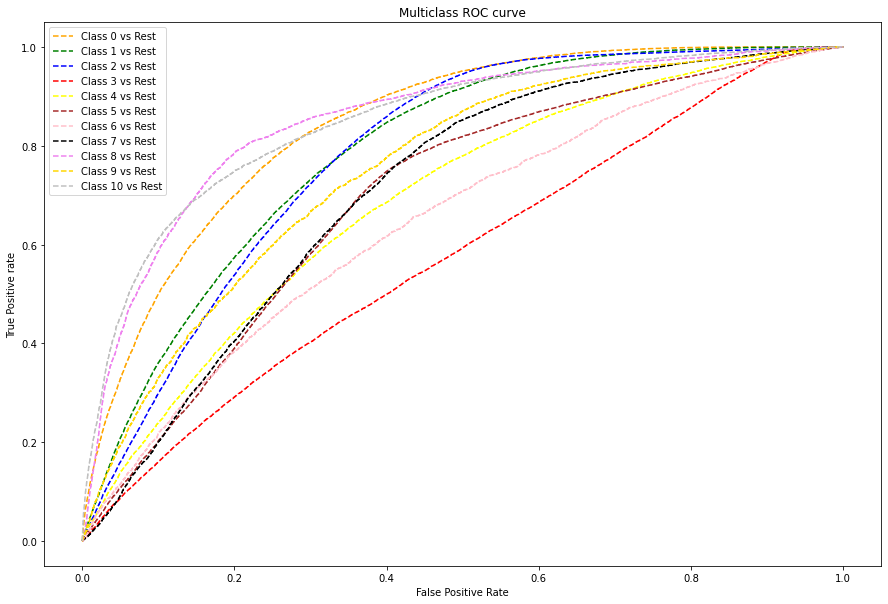

In [210]:
fpr = {}
tpr = {}
thresh ={}

n_class = 11

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, y_pred_prob[:,i], pos_label=i)
    
# plotting
plt.figure(figsize=(15,10))
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label='Class 3 vs Rest')
plt.plot(fpr[4], tpr[4], linestyle='--',color='yellow', label='Class 4 vs Rest')
plt.plot(fpr[5], tpr[5], linestyle='--',color='brown', label='Class 5 vs Rest')
plt.plot(fpr[6], tpr[6], linestyle='--',color='pink', label='Class 6 vs Rest')
plt.plot(fpr[7], tpr[7], linestyle='--',color='black', label='Class 7 vs Rest')
plt.plot(fpr[8], tpr[8], linestyle='--',color='violet', label='Class 8 vs Rest')
plt.plot(fpr[9], tpr[9], linestyle='--',color='gold', label='Class 9 vs Rest')
plt.plot(fpr[10], tpr[10], linestyle='--',color='silver', label='Class 10 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300);  
plt.show()

In [211]:
update_score_card(model_name='Oversampling OneVsrest(RandomForestClassifier)')

,Model,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,OneVsrest(LogReg),0.564744,0.395250,0.395250,0.395250,0.216409,0.395250
1,OneVsrest(LogRegSGD),0.562615,0.389428,0.389428,0.389428,0.208930,0.389428
2,OneVsrest(RandomForestClassifier),0.570445,0.406063,0.406063,0.406063,0.229090,0.406063
3,Oversampling OneVsrest(RandomForestClassifier),0.558705,0.197400,0.197400,0.197400,0.117237,0.197400


After oversampling the results are very bad

so randomforest without oversampling was good